In [318]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image as Image

### Welcome! 

In the next 2 Days we are going to learn how to work with image data mostly using packages: 
- opencv (cv2) 
- pillow (PIL)

### 1. Loading and Displaying

Let's start with learning how to load Images into Python

#### Using PIL

In [319]:
filename = "img/puppy.jpg"

In [320]:
# Loading Image with PIL
# Location of the image
img = Image.open(filename)

# alternative way
#with Image.open(filename) as img:
#   img.load()

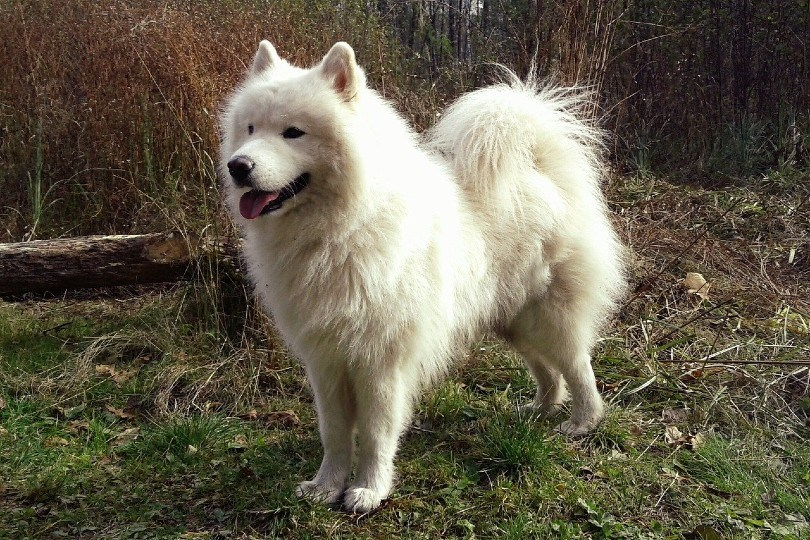

In [321]:
img

In [322]:
img.show()

Check the key properties of an image you work with

In [323]:
img.format

'JPEG'

In [324]:
img.size

(810, 540)

In [325]:
img.mode

'RGB'

Basic Image Manipulation

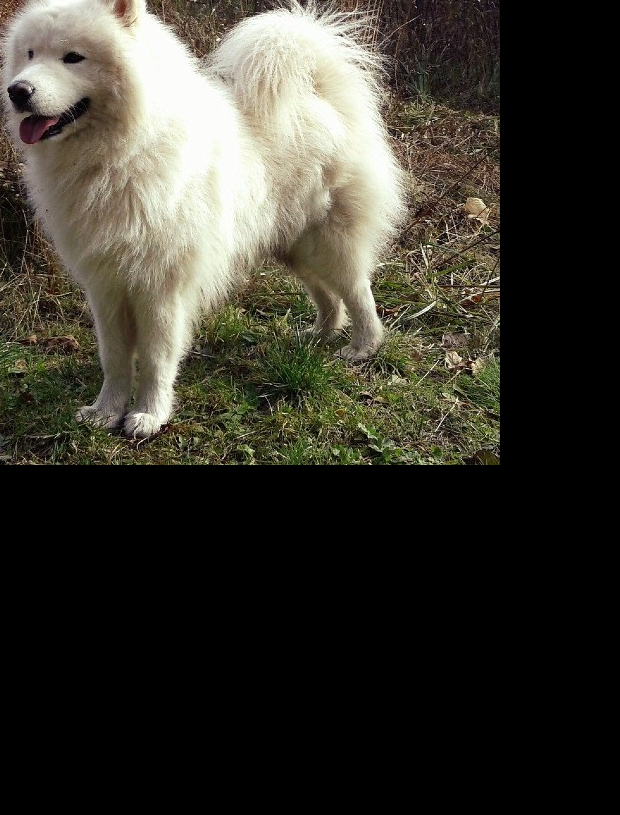

In [376]:
# left - right - top - bottom

cropped_img = img.crop((100,0,720,815))
cropped_img

In [327]:
cropped_img.size, cropped_img.height, cropped_img.width

((600, 740), 740, 600)

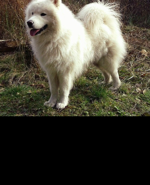

In [328]:
low_res_img = cropped_img.resize(
       (cropped_img.width // 4, cropped_img.height // 4)
    )
low_res_img

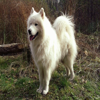

In [329]:
img.resize((100, 100))

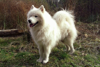

In [330]:
resized_img = img.copy()
resized_img.thumbnail((100, 100))
resized_img

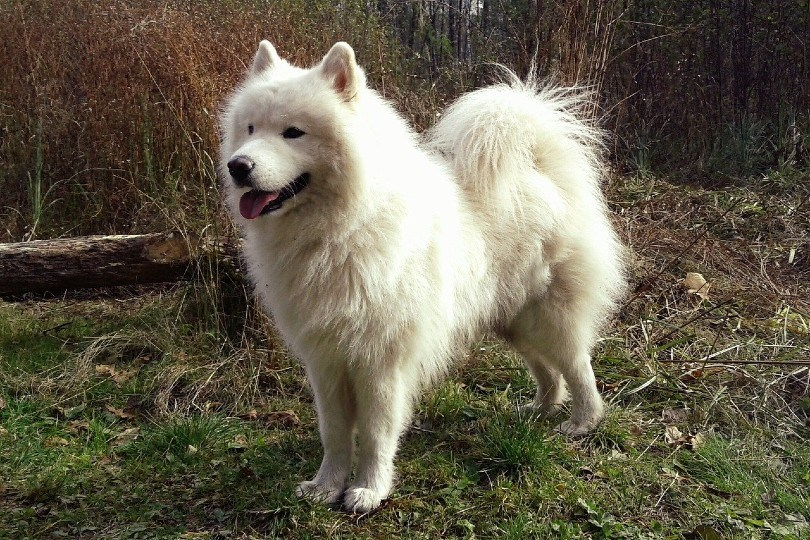

In [331]:
img

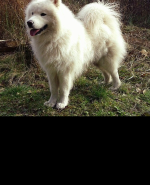

In [332]:
low_res_img = cropped_img.reduce(4)
low_res_img

In [333]:
# saving image
cropped_img.save("img/cropped_image.jpg")
low_res_img.save("img/low_resolution_cropped_image.png")


    1. Image.FLIP_LEFT_RIGHT: Flips the image left to right, resulting in a mirror image
    2. Image.FLIP_TOP_BOTTOM: Flips the image top to bottom
    3. Image.ROTATE_90: Rotates the image by 90 degrees counterclockwise
    4. Image.ROTATE_180: Rotates the image by 180 degrees
    5. Image.ROTATE_270: Rotates the image by 270 degrees counterclockwise, which is the same as 90 degrees clockwise
    6. Image.TRANSPOSE: Transposes the rows and columns using the top-left pixel as the origin, with the top-left pixel being the same in the transposed image as in the original image
    7. Image.TRANSVERSE: Transposes the rows and columns using the bottom-left pixel as the origin, with the bottom-left pixel being the one that remains fixed between the original and modified versions


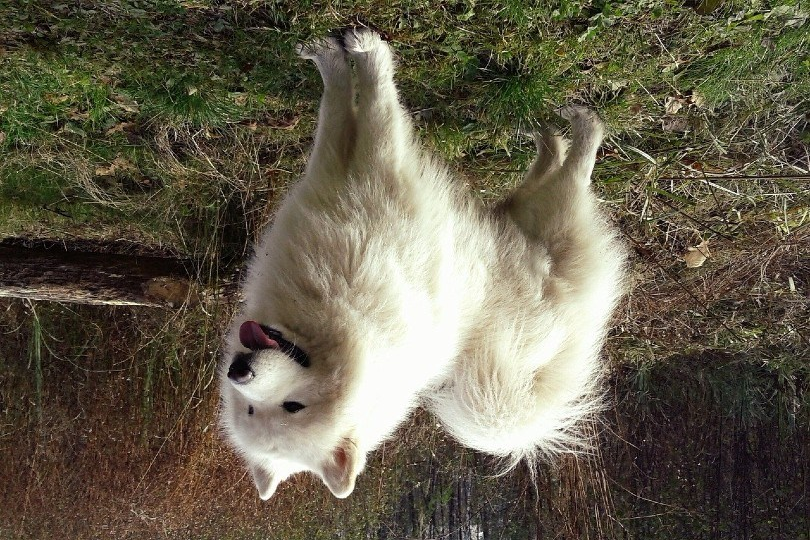

In [334]:
converted_img = img.transpose(Image.FLIP_TOP_BOTTOM)
converted_img

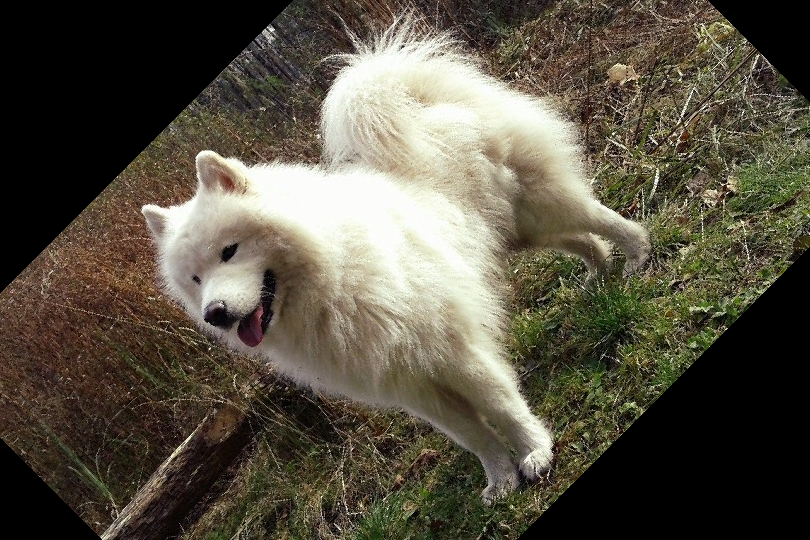

In [335]:
img.rotate(45)

In [336]:
img.getbands()

('R', 'G', 'B')

In [337]:
cmyk_img = img.convert("CMYK")
gray_img = img.convert("L")

In [338]:
cmyk_img.getbands(), gray_img.getbands()

(('C', 'M', 'Y', 'K'), ('L',))

In [339]:
red, green, blue = img.split()
red.show()
green.show()
blue.show()

In [340]:
red.mode # luminance values in grayscale

'L'

In [341]:
zeroed_band = red.point(lambda _: 0)

red_merge = Image.merge(
     "RGB", (red, zeroed_band, zeroed_band)
)

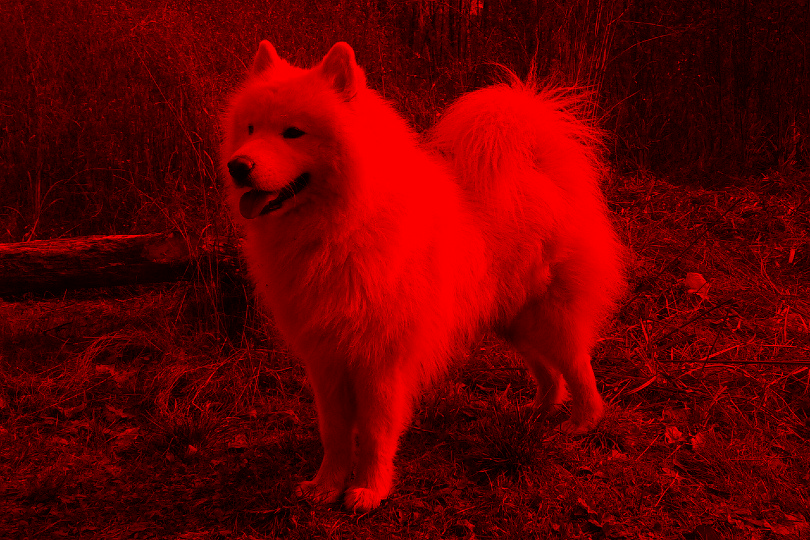

In [342]:
red_merge

In [343]:
green_merge = Image.merge(
     "RGB", (zeroed_band, green, zeroed_band)
)

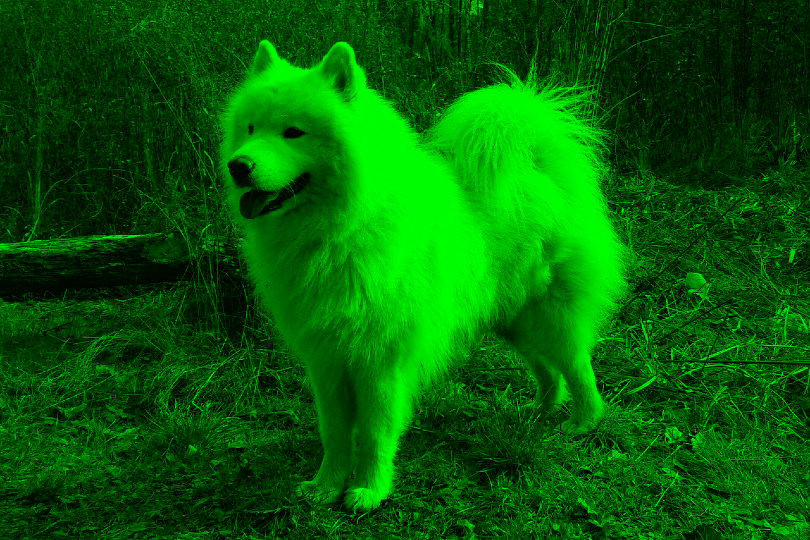

In [344]:
green_merge

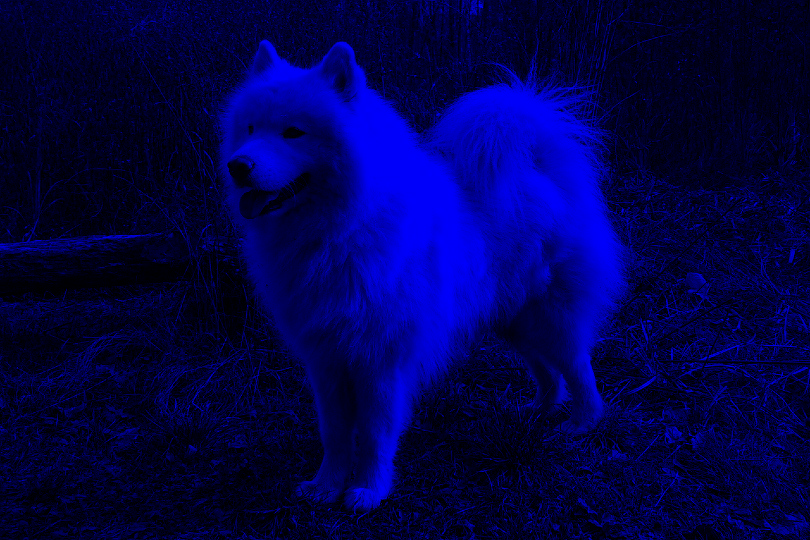

In [345]:
blue_merge = Image.merge(
     "RGB", (zeroed_band, zeroed_band, blue)
)
blue_merge

# Kernels

In [346]:
from PIL import ImageFilter

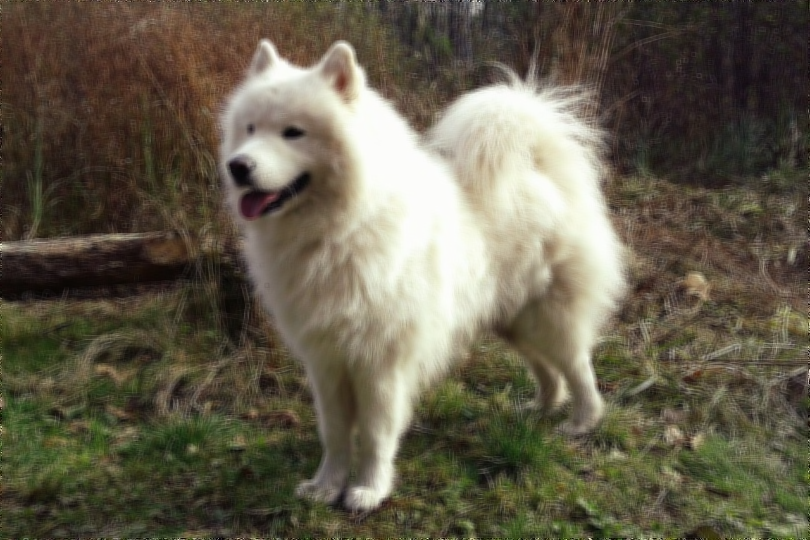

In [347]:
blur_img = img.filter(ImageFilter.BLUR)
blur_img

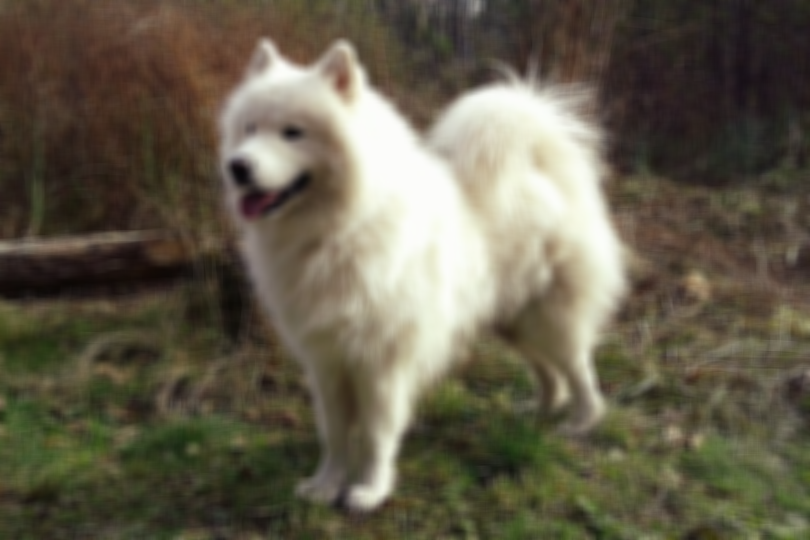

In [348]:
img.filter(ImageFilter.BoxBlur(5))

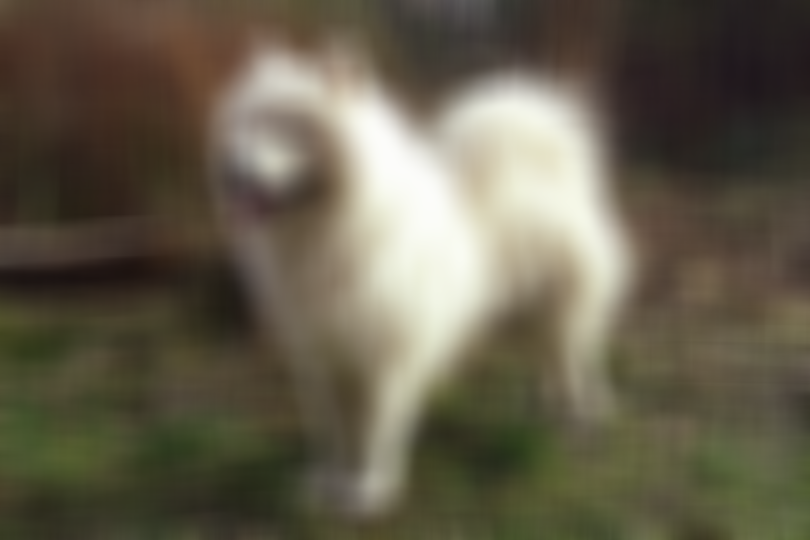

In [349]:
img.filter(ImageFilter.BoxBlur(20))

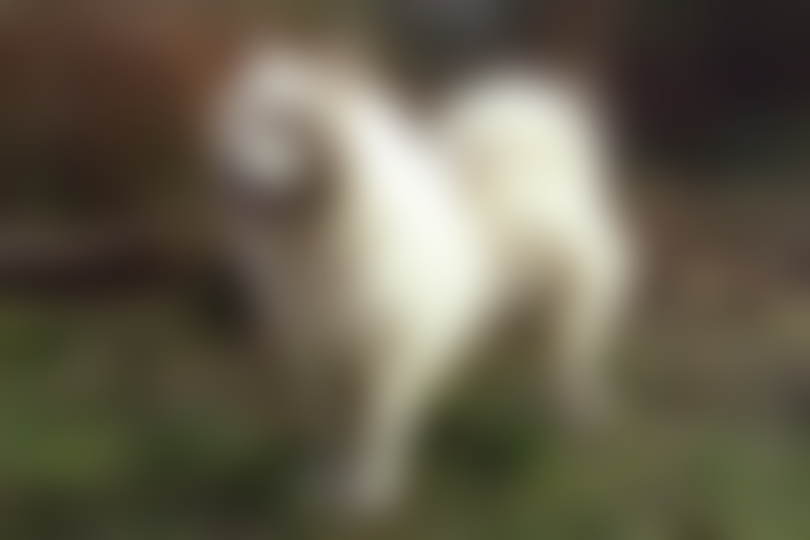

In [350]:
img.filter(ImageFilter.GaussianBlur(20))

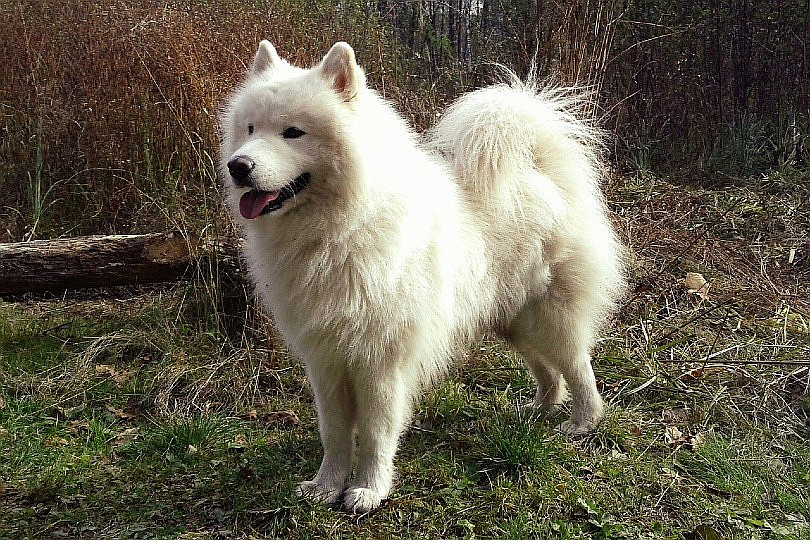

In [351]:
img.filter(ImageFilter.SHARPEN)

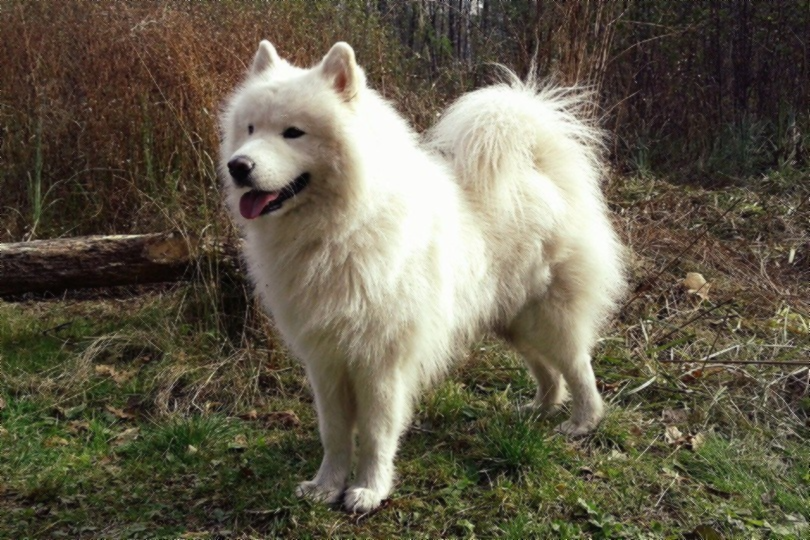

In [352]:
smooth_img = img.filter(ImageFilter.SMOOTH)
smooth_img

# Sth

In [353]:
img_gray = img.convert("L")

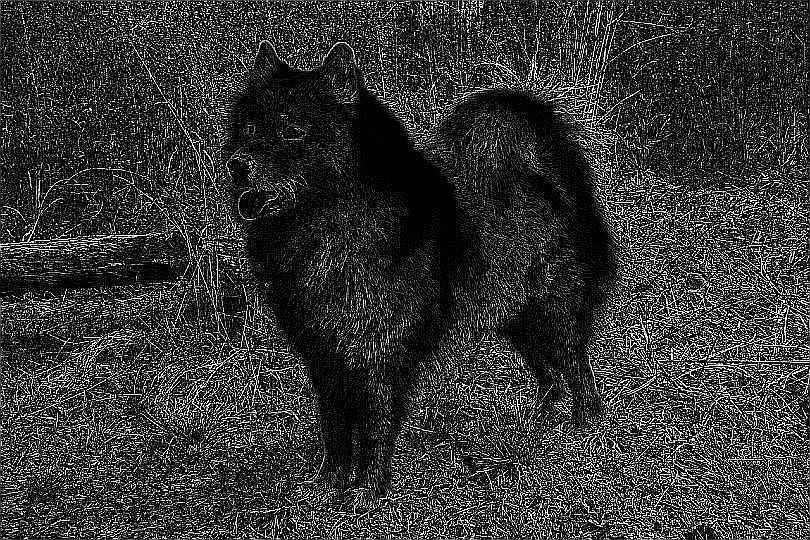

In [354]:
edges = img_gray.filter(ImageFilter.FIND_EDGES)
edges

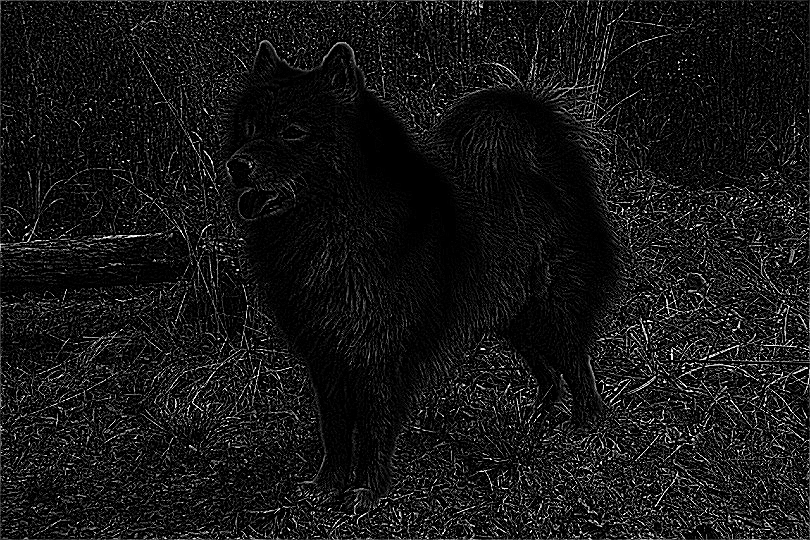

In [355]:
img_gray_smooth = img_gray.filter(ImageFilter.SMOOTH)
edges_smooth = img_gray_smooth.filter(ImageFilter.FIND_EDGES)
edges_smooth

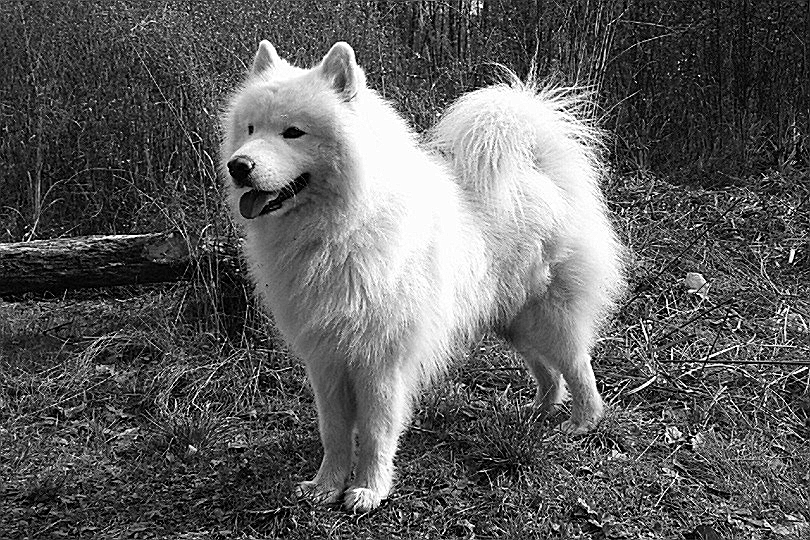

In [356]:
edge_enhance = img_gray_smooth.filter(ImageFilter.EDGE_ENHANCE)
edge_enhance

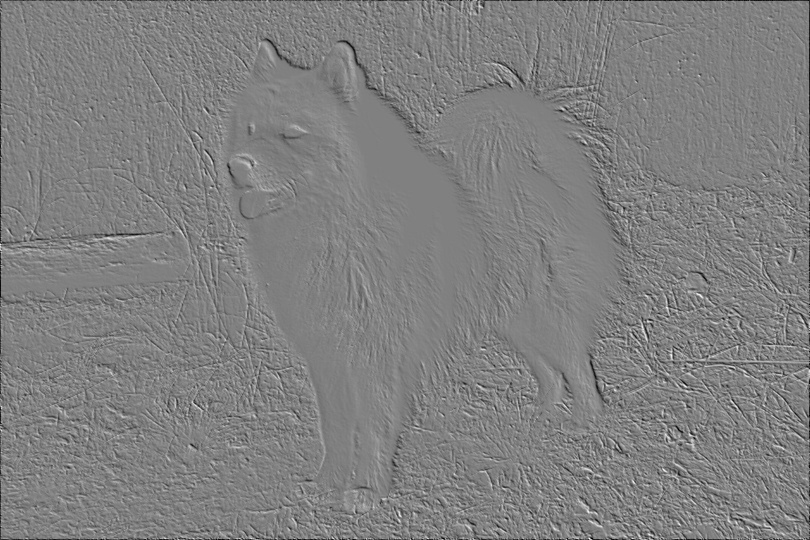

In [357]:
emboss = img_gray_smooth.filter(ImageFilter.EMBOSS)
emboss

# Image Segmentation

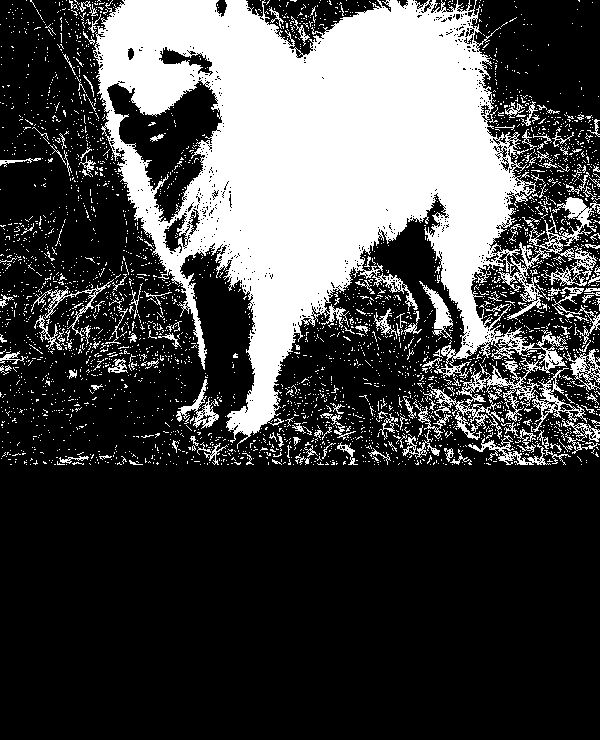

In [372]:
img_gray = img.convert("L")
threshold = 100

img_cat_threshold = img_gray.point(
     lambda x: 255 if x > threshold else 0
 )

img_cat_threshold

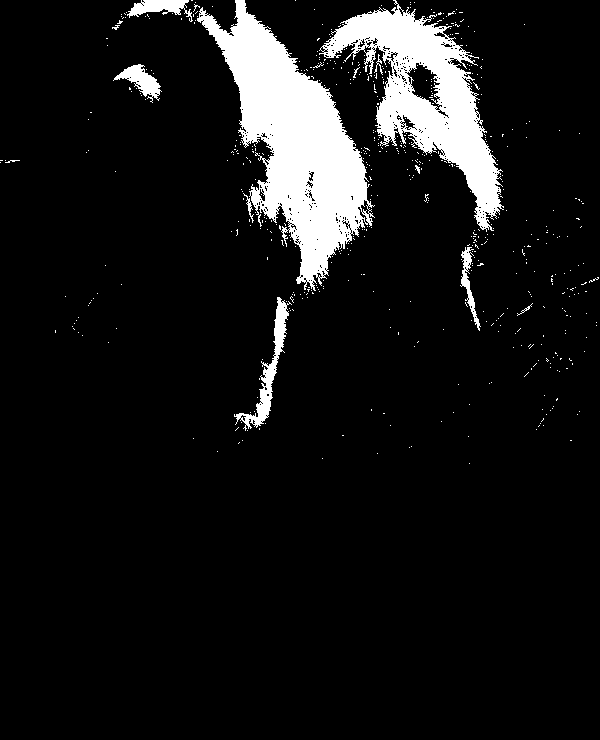

In [373]:
threshold = 200
img_threshold = blue.point(lambda x: 255 if x > threshold else 0)
img_threshold = img_threshold.convert("1")
img_threshold

# Erosion and Dilation

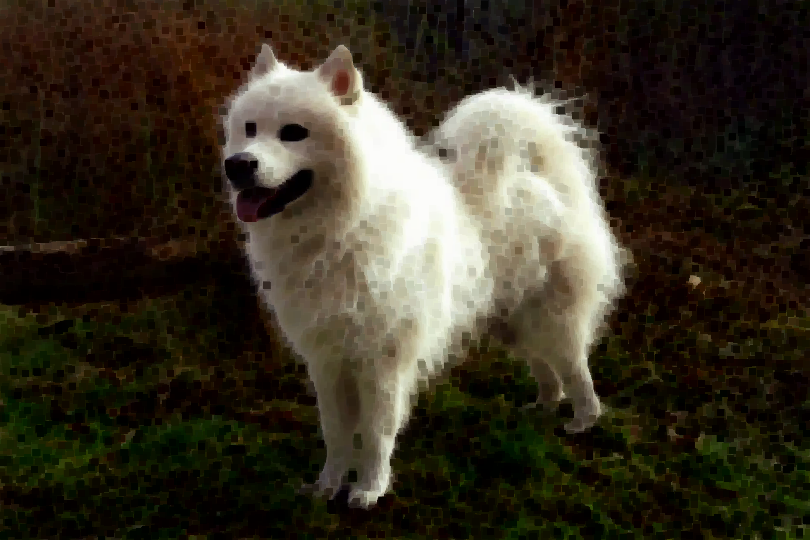

In [360]:
for _ in range(3):
     img = img.filter(ImageFilter.MinFilter(3))
     
img

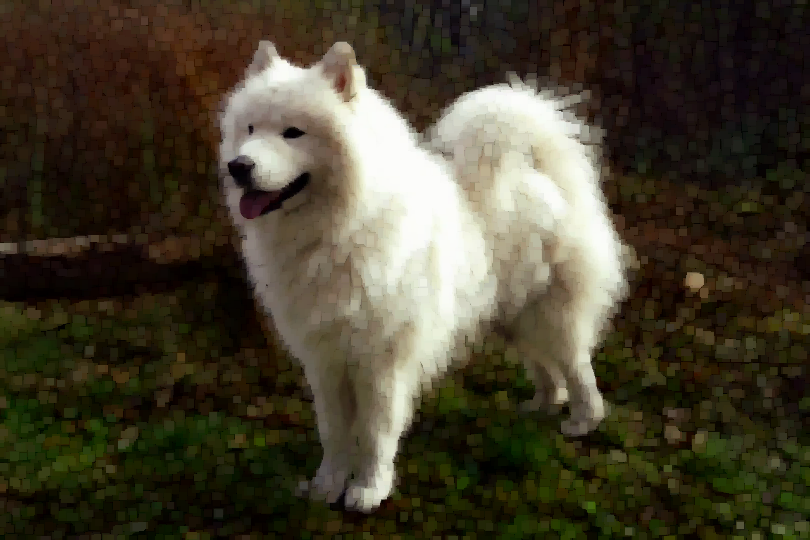

In [361]:
for _ in range(3):
     img = img.filter(ImageFilter.MaxFilter(3))
     
img

In [362]:
def erode(cycles, image):
     for _ in range(cycles):
          image = image.filter(ImageFilter.MinFilter(3))
     return image

def dilate(cycles, image):
     for _ in range(cycles):
          image = image.filter(ImageFilter.MaxFilter(3))
     return image

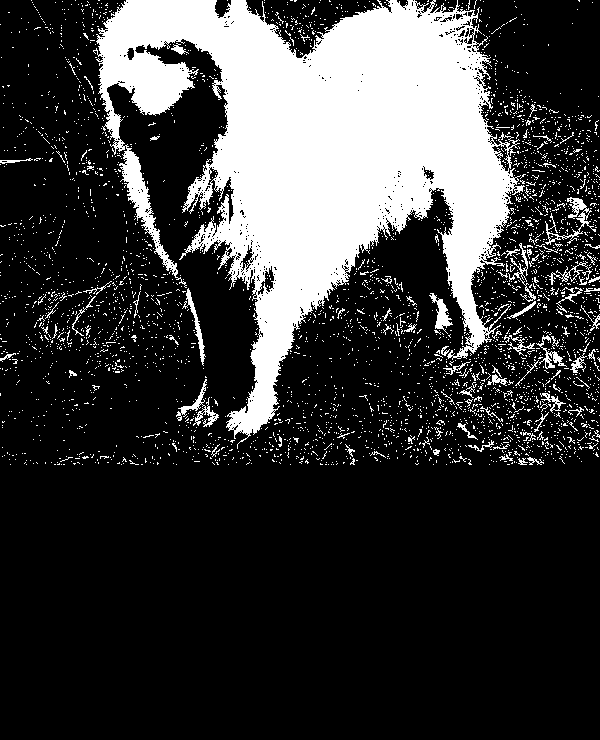

In [363]:
img = Image.open(filename)

img = img.crop((120,75,720,815))

# split the channels
red, green, blue = img.split()

# set threshold
threshold = 100
img_threshold = blue.point(lambda x: 255 if x > threshold else 0)
img_threshold = img_threshold.convert("1")
img_threshold

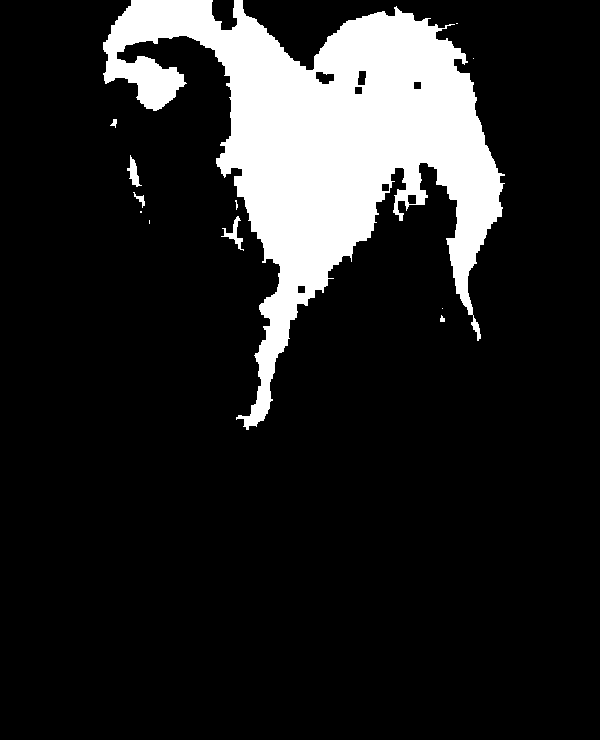

In [364]:
img_eroded = erode(3, img_threshold)
img_eroded

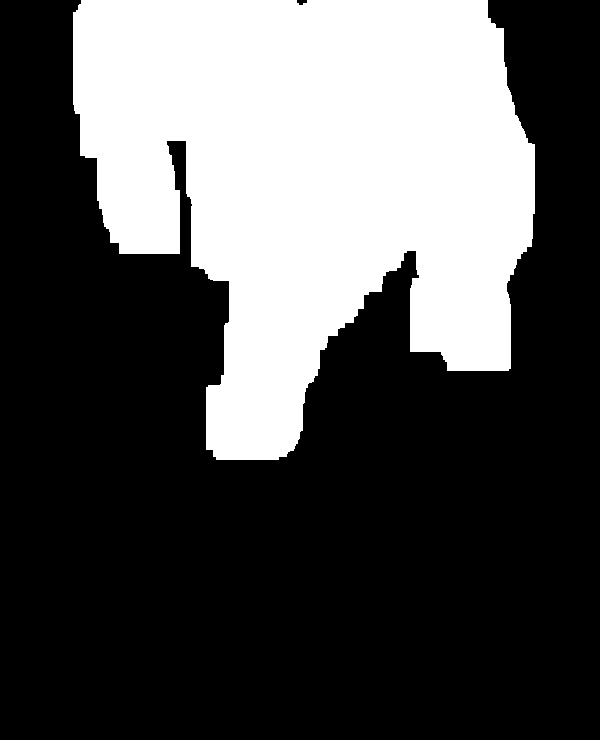

In [365]:
img_distilled = dilate(30, img_eroded)
img_distilled

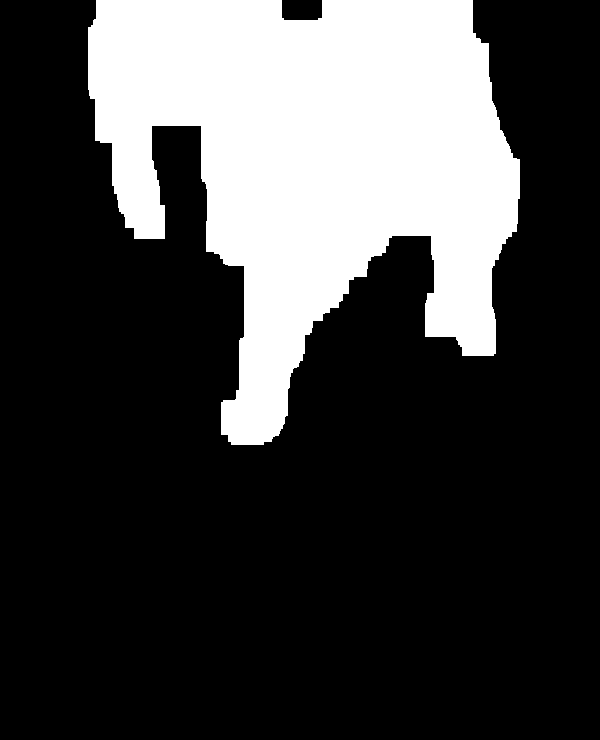

In [366]:
mask = erode(15, img_distilled)
mask

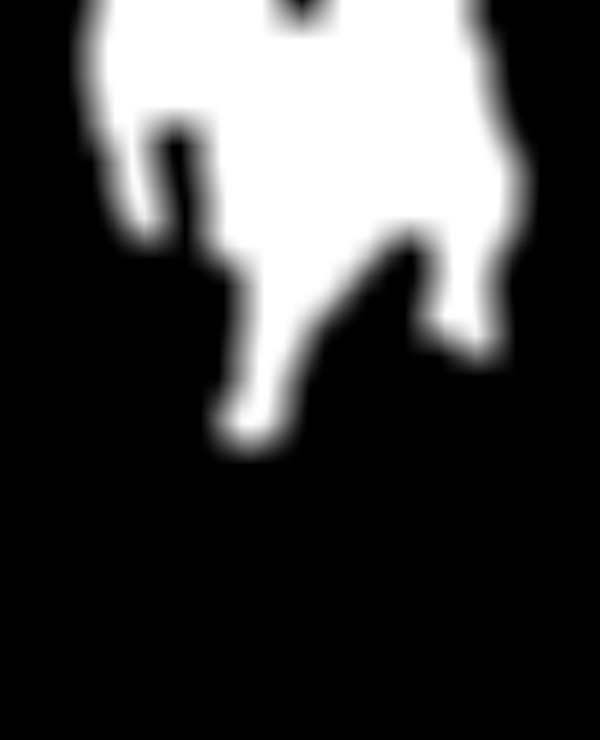

In [367]:
mask = mask.convert("L")
mask = mask.filter(ImageFilter.BoxBlur(20))

mask

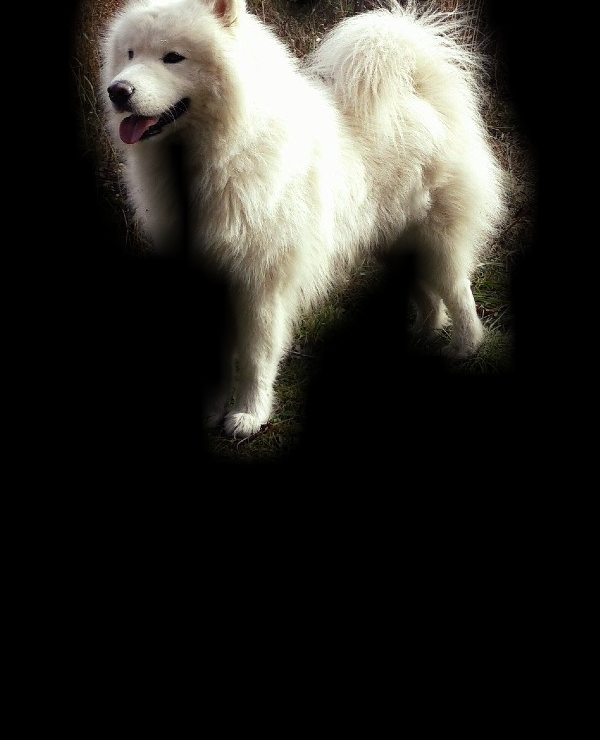

In [368]:
blank = img.point(lambda _: 0)

segmented = Image.composite(img, blank, mask)
segmented

(840, 600) (600, 740)
(420, 300)


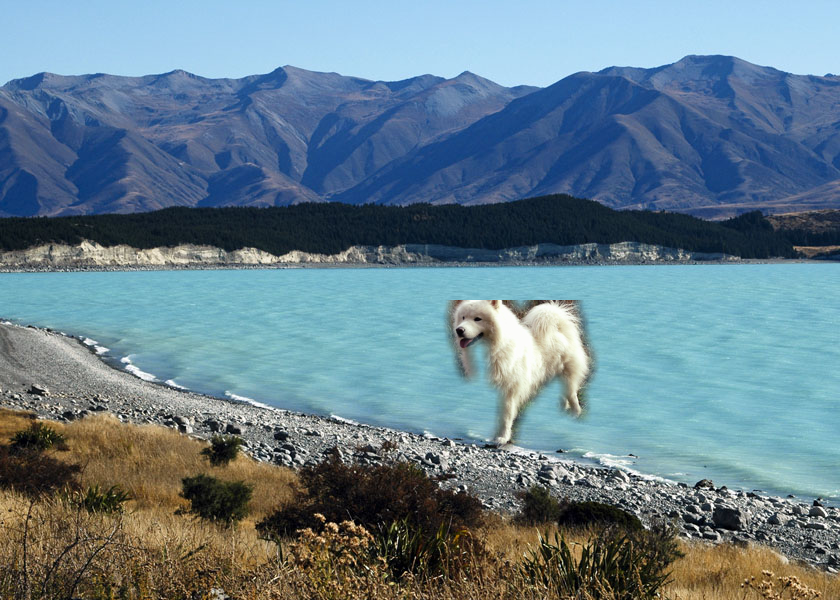

In [369]:
filename_background = "img/New_Zealand_Lake.jpg"
with Image.open(filename_background) as background:
    background.load()
    
print(background.size, img.size)

scale_factor = 3
position = (int(background.width/2), int(background.height/2))

print(position)

background.paste(
    img.resize((img.width // scale_factor, img.height // scale_factor)),
    position,
    mask.resize((mask.width // scale_factor, mask.height // scale_factor)),
 )

background

# Working with multiple images

In [370]:
im1 = Image.open("img/puppy.jpg")
im2 = Image.open("img/puppy.jpg")



Image.alpha_composite(im1, im2)

ValueError: image has wrong mode